In [57]:
!sudo apt install tesseract-ocr libtesseract-dev
!pip -q install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libtesseract-dev is already the newest version (4.1.1-2.1build1).
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.


In [58]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [59]:
kfc = '/content/drive/MyDrive/540.png'

In [60]:
import cv2
import pytesseract
from PIL import Image
img = cv2.imread(kfc)
pil_img = Image.fromarray(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

# Adding custom options
custom_config = r'--oem 3 --psm 6'
text = pytesseract.image_to_string(img, config=custom_config)
print(text)

INFO SESSION
RECYCLING FUND SECRETARIAT
HONG KONG PRODUCTIVITY COUNCIL
15 Oct 2024 (Tue)
3 - 4pm

Online via zoom
£ Register here:
Mr Sam Lee
Head, Recycling Fund Secretariat
Hong Kong Productivity Council (HKPC)



In [61]:
import cv2
import numpy as np

img = cv2.imread('image.jpg')

# get grayscale image
def get_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# noise removal
def remove_noise(image):
    return cv2.medianBlur(image,5)

#thresholding
def thresholding(image):
    return cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

#dilation
def dilate(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.dilate(image, kernel, iterations = 1)

#erosion
def erode(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.erode(image, kernel, iterations = 1)

#opening - erosion followed by dilation
def opening(image):
    kernel = np.ones((5,5),np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)

#canny edge detection
def canny(image):
    return cv2.Canny(image, 100, 200)

#skew correction
def deskew(image):
    coords = np.column_stack(np.where(image > 0))
    angle = cv2.minAreaRect(coords)[-1]
    if angle < -45:
        angle = -(90 + angle)
    else:
        angle = -angle
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated

#template matching
def match_template(image, template):
    return cv2.matchTemplate(image, template, cv2.TM_CCOEFF_NORMED)

In [62]:
kfc = '/content/drive/MyDrive/540.png'
image = cv2.imread(kfc)
def opening(image):
  return kfc
def canny(image):
  return kfc
gray = get_grayscale(image)
thresh = thresholding(gray)
opening = opening(gray)
canny = canny(gray)

In [63]:
# this is only for google colab, the original is cv2.imshow()
from google.colab.patches import cv2_imshow

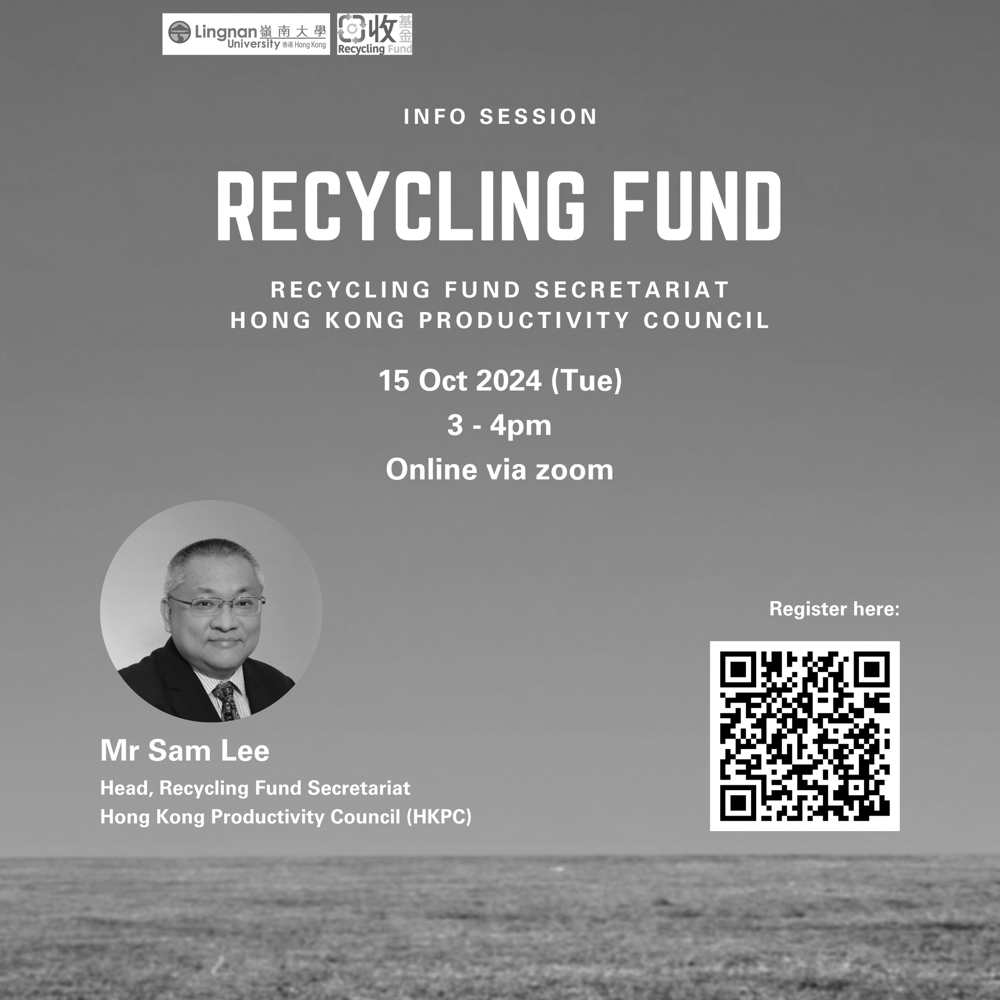

'INiversity 4% Hong Kong Recycling\nINFO SESSION\nRECYCLING FUND SECRETARIAT\nHONG KONG PRODUCTIVITY COUNCIL\n15 Oct 2024 (Tue)\n3 - 4pm\nOnline via zoom\n"7 Ey ¥ Register here:\nFes\nyw 4 [a] a Aa [=]\nee | ee\nMr Sam Lee sates ;\nHead, Recycling Fund Secretariat fo!\nHong Kong Productivity Council (HKPC) (eer. -\n\x0c'

In [64]:
img = gray
cv2_imshow(img)
# Adding custom options
custom_config = r'--oem 3 --psm 6'
pytesseract.image_to_string(img, config=custom_config)

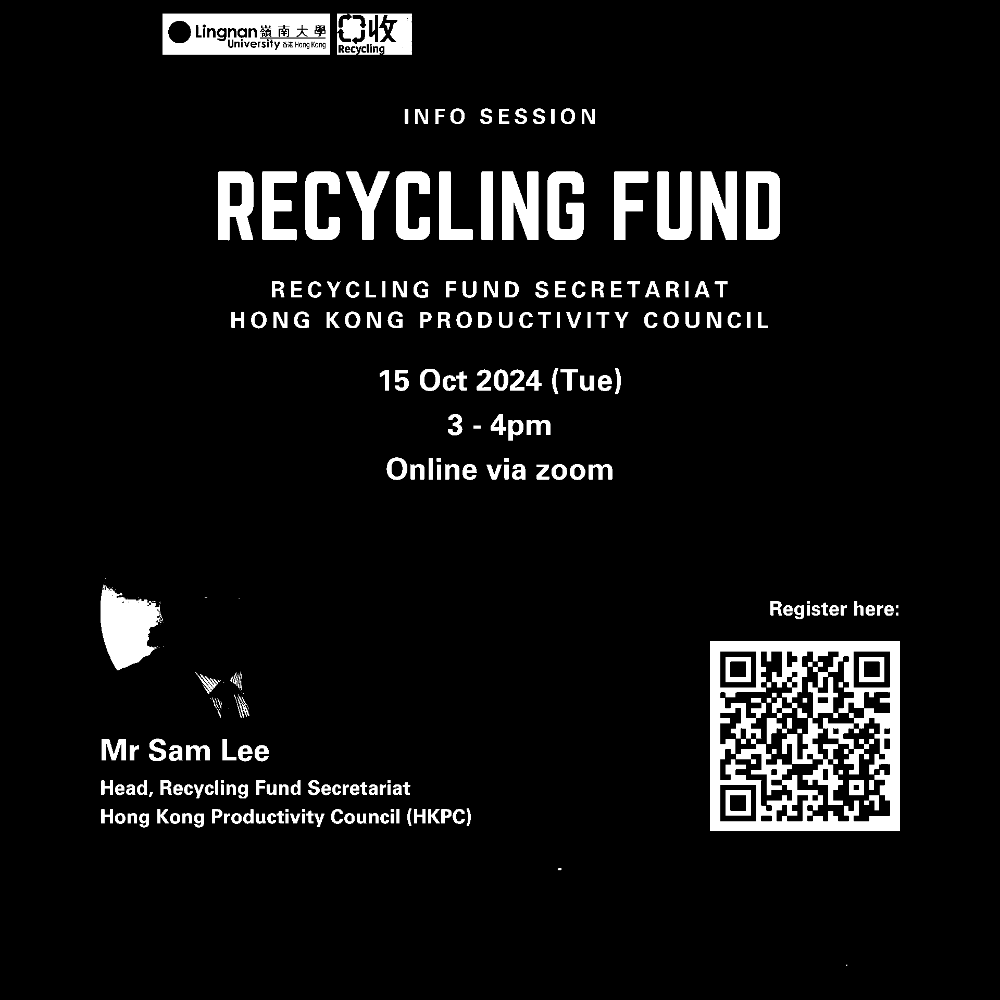

'INiversity s% Hong Kong Recycling\nINFO SESSION\nRECYCLING FUND SECRETARIAT\nHONG KONG PRODUCTIVITY COUNCIL\n15 Oct 2024 (Tue)\nea\nOnline via zoom\n4 a Register here:\nFes\n| [m] a Ae [=]\n‘a ae\nMr Sam Lee sae ,\nHead, Recycling Fund Secretariat "a" h\nHong Kong Productivity Council (HKPC) eer -\n\x0c'

In [65]:
img = thresh
cv2_imshow(img)
# Adding custom options
custom_config = r'--oem 3 --psm 6'
pytesseract.image_to_string(img, config=custom_config)

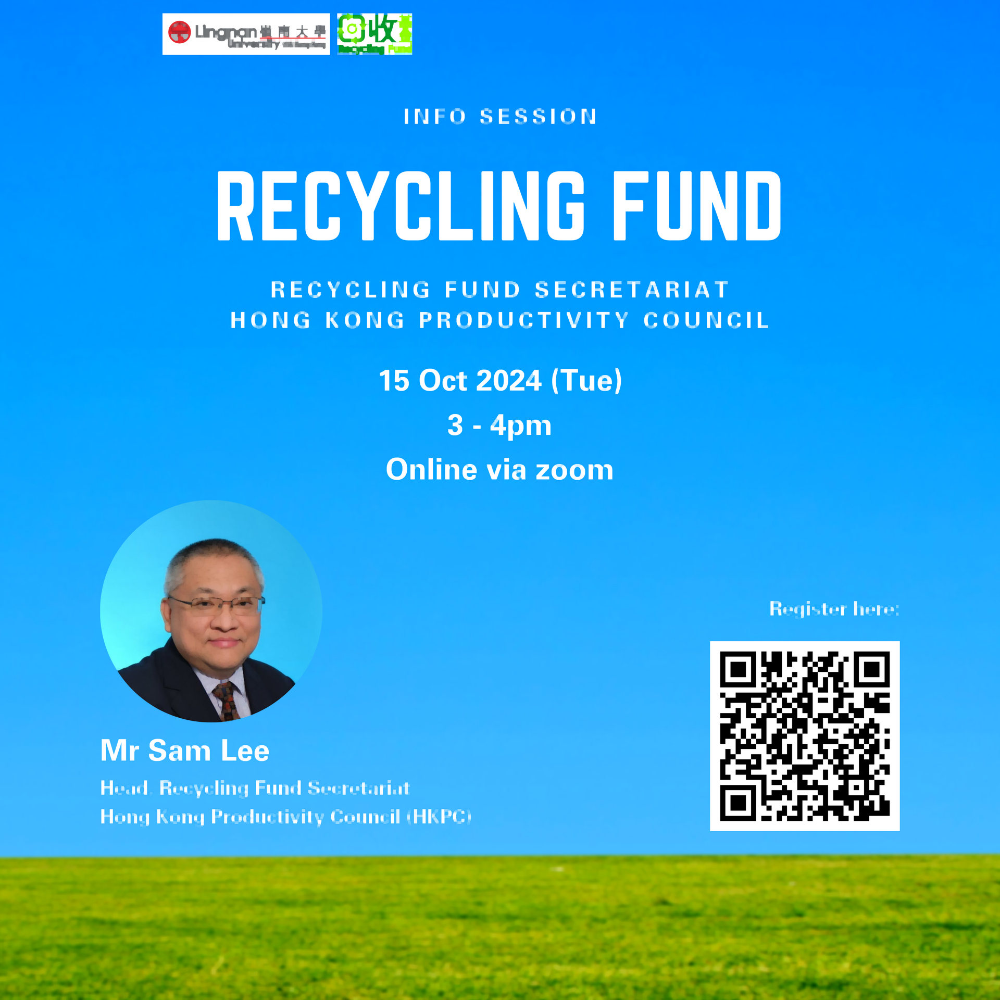

'INFO SESSION\nRECYCLING FUND SECRETARIAT\nHONG KONG PRODUCTIVITY COUNCIL\n15 Oct 2024 (Tue)\n3 -4pm\n\nOnline via zoom\n& Reqister here:\nMr Sam Lee\nHead Reeyeling Fund Secretariat\nHong Kong Productivity Council (HKPC)\n\x0c'

In [66]:
import cv2
import pytesseract
from google.colab.patches import cv2_imshow
img = cv2.imread(kfc)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
cv2_imshow(opening)
custom_config = r'--oem 3 --psm 6'
pytesseract.image_to_string(opening, config=custom_config)

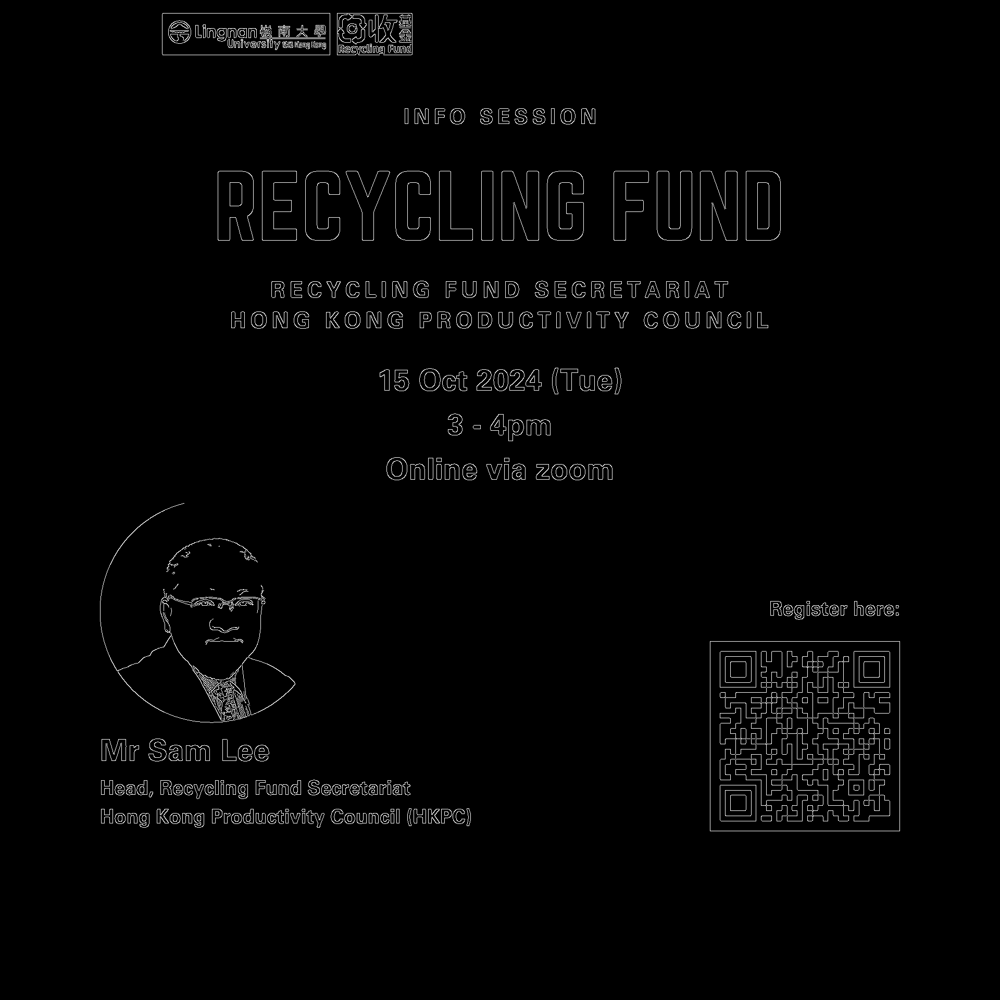

'INFO SESSION\nRECYCLING FUND SECRETARIAT\nHONG KONG PRODUCTIVITY COUNCIL\n15 Oct 2024 (Tue)\n3 - 4pm\n\nOnline via zoom\n£ Register here:\nMr Sam Lee\nHead, Recycling Fund Secretariat\nHong Kong Productivity Council (HKPC)\n\x0c'

In [67]:
import cv2
import pytesseract
from google.colab.patches import cv2_imshow
img = cv2.imread(kfc)
canny = cv2.Canny(gray, threshold1=100, threshold2=200)
cv2_imshow(canny)
# Adding custom options
custom_config = r'--oem 3 --psm 6'
pytesseract.image_to_string(img, config=custom_config)

In [68]:
import cv2
import pytesseract
from pytesseract import Output
img = cv2.imread(kfc)
d = pytesseract.image_to_data(img, output_type=Output.DICT)
print(d.keys())


dict_keys(['level', 'page_num', 'block_num', 'par_num', 'line_num', 'word_num', 'left', 'top', 'width', 'height', 'conf', 'text'])


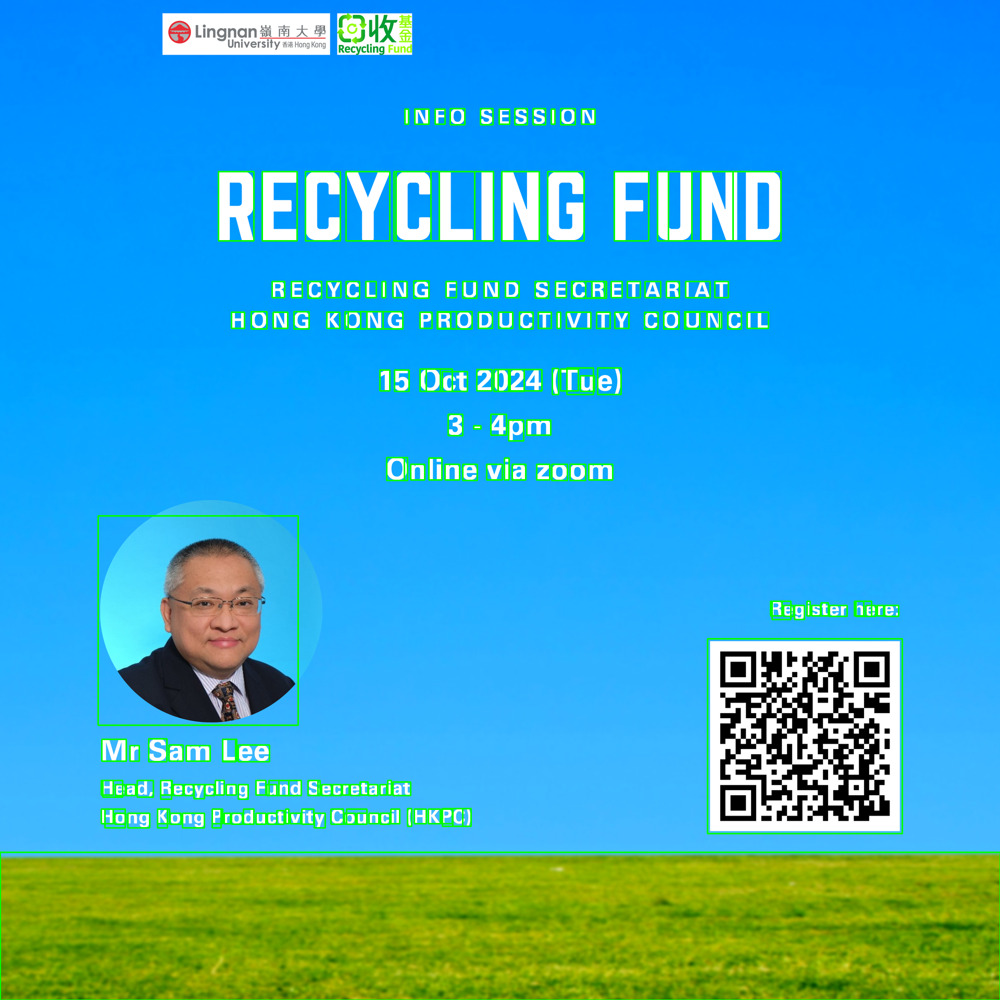

-1

In [69]:
import cv2
import pytesseract

img = cv2.imread(kfc)

h, w, c = img.shape
boxes = pytesseract.image_to_boxes(img)
for b in boxes.splitlines():
    b = b.split(' ')
    img = cv2.rectangle(img, (int(b[1]), h - int(b[2])), (int(b[3]), h - int(b[4])), (0, 255, 0), 2)

cv2_imshow( img)
cv2.waitKey(0)

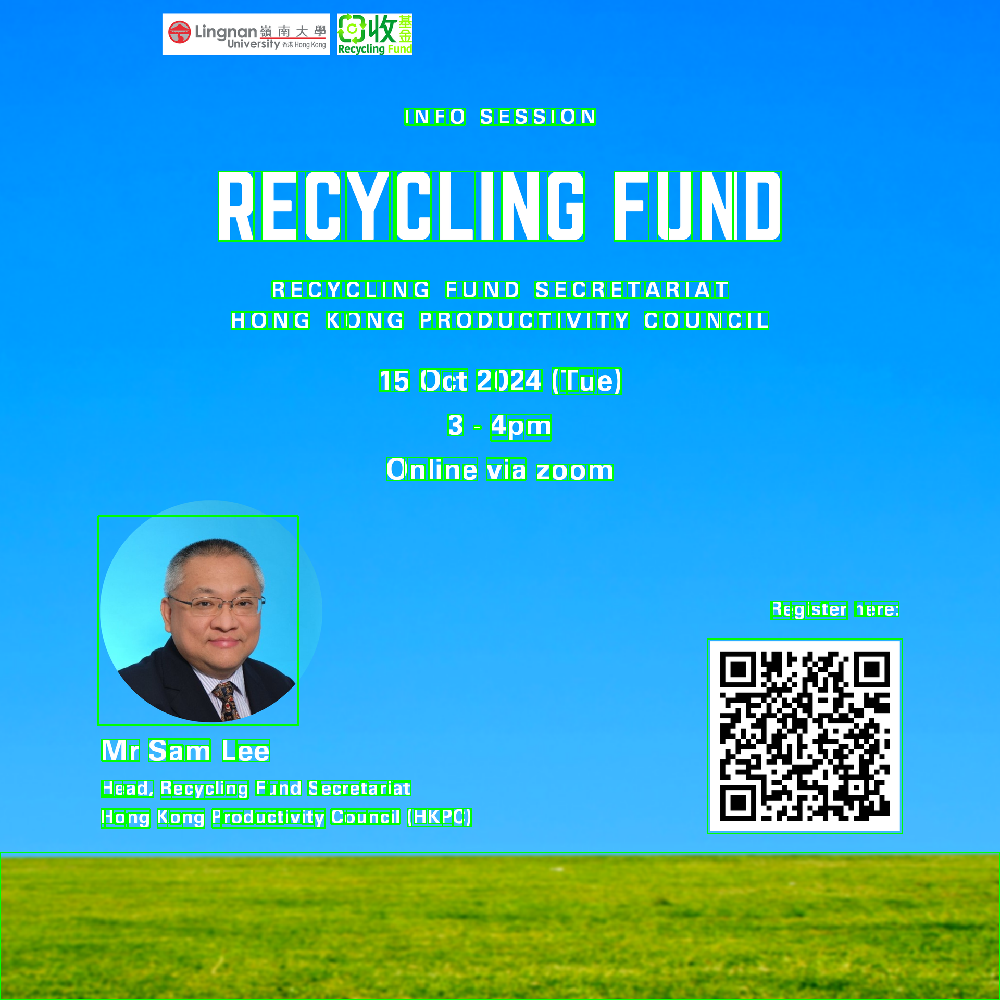

-1

In [70]:
n_boxes = len(d['text'])
for i in range(n_boxes):
    if int(d['conf'][i]) > 60:
        (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
        img = cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

cv2_imshow(img)
cv2.waitKey(0)

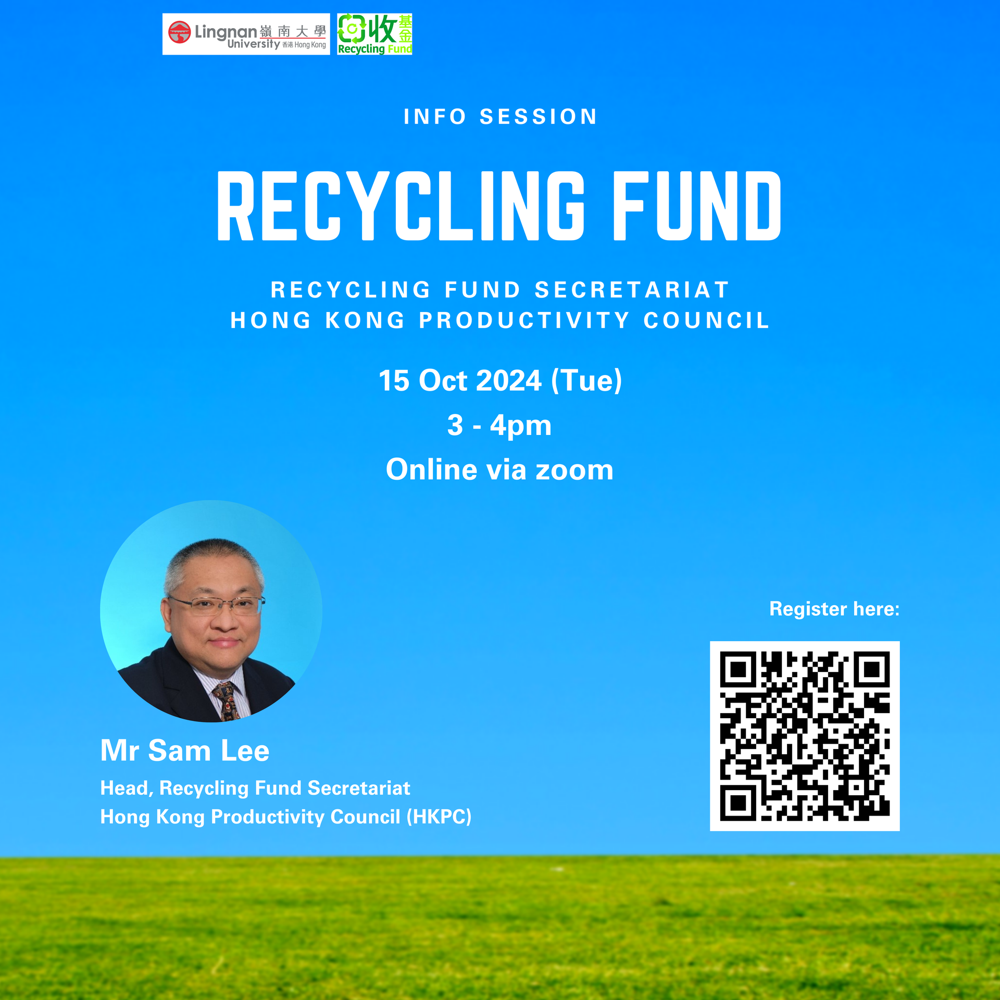

-1

In [71]:
import re
import cv2
import pytesseract
from pytesseract import Output

img = cv2.imread(kfc)
d = pytesseract.image_to_data(img, output_type=Output.DICT)
keys = list(d.keys())

date_pattern = '^(0[1-9]|[12][0-9]|3[01])/(0[1-9]|1[012])/(19|20)\d\d$'

n_boxes = len(d['text'])
for i in range(n_boxes):
    if int(d['conf'][i]) > 60:
    	if re.match(date_pattern, d['text'][i]):
	        (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
	        img = cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

cv2_imshow( img)
cv2.waitKey(0)

In [72]:
custom_config = r'--oem 3 --psm 6 outputbase digits'
print(pytesseract.image_to_string(img, config=custom_config))


1502024
3-4



In [73]:
custom_config = r'-c tessedit_char_blacklist=0123456789 --psm 6'
pytesseract.image_to_string(img, config=custom_config)


'INFO SESSION\nRECYCLING FUND SECRETARIAT\nHONG KONG PRODUCTIVITY COUNCIL\nOct Z (Tue)\n$ - pm\n\nOnline via zoom\n£ Register here:\nMr Sam Lee\nHead, Recycling Fund Secretariat\nHong Kong Productivity Council (HKPC)\n\x0c'

In [74]:
!tesseract --list-langs

List of available languages (4):
eng
grc
osd
tha


In [75]:
custom_config = r'-l eng --psm 6'
pytesseract.image_to_string(img, config=custom_config)

'INFO SESSION\nRECYCLING FUND SECRETARIAT\nHONG KONG PRODUCTIVITY COUNCIL\n15 Oct 2024 (Tue)\n3 - 4pm\n\nOnline via zoom\n£ Register here:\nMr Sam Lee\nHead, Recycling Fund Secretariat\nHong Kong Productivity Council (HKPC)\n\x0c'

In [76]:
!sudo apt-get install tesseract-ocr-grc
!sudo apt-get install tesseract-ocr-tha

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr-grc is already the newest version (1:4.00~git30-7274cfa-1.1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr-tha is already the newest version (1:4.00~git30-7274cfa-1.1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.


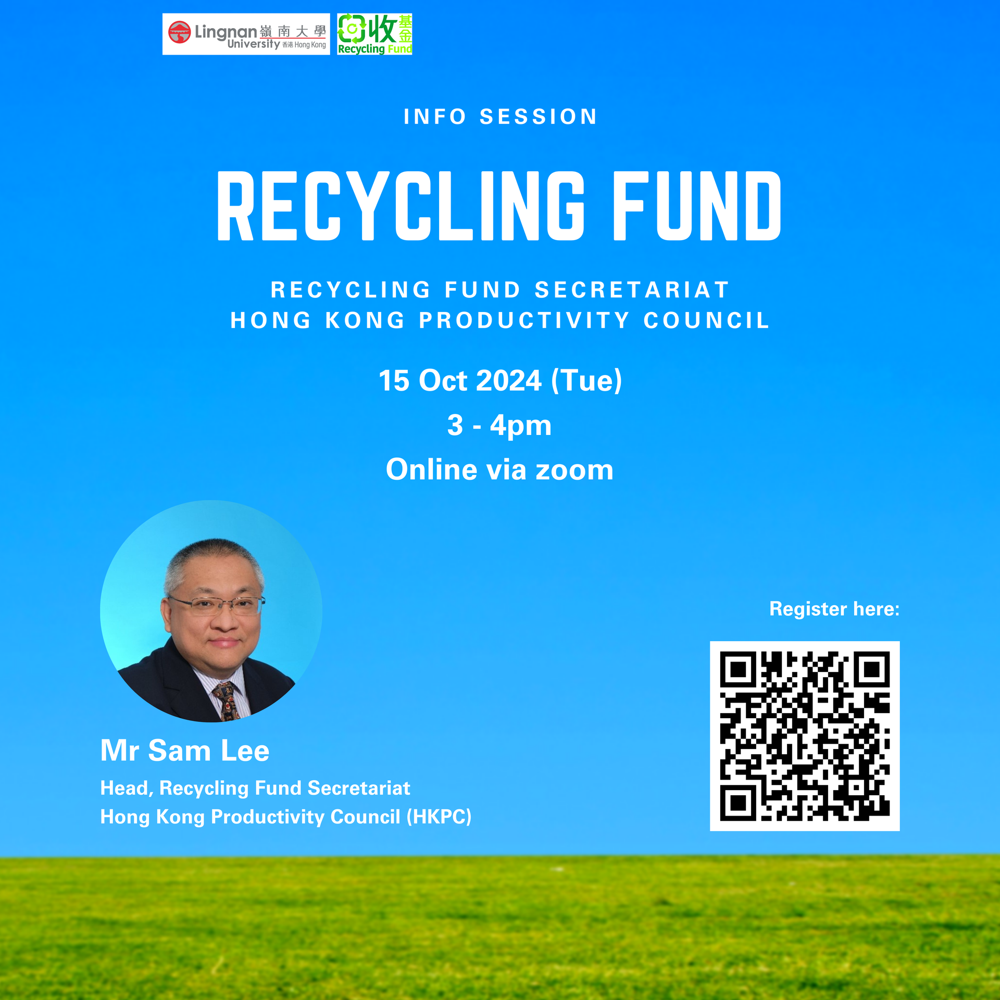

'INFO SESSION\nRECYCLING FUND SECRETARIAT\nHONG KONG PRODUCTIVITY COUNCIL\n15 Oct 2024 (Tue)\n3 - 4pm\n\nOnline via zoom\nΔ Register here:\nMr Sam Lee\nHead, Recycling Fund Secretariat\nHong Kong Productivity Council (HKPC)\n\x0c'

In [77]:
img = cv2.imread(kfc)
cv2_imshow(img)
# Adding custom options
custom_config = r'-l grc+tha+eng --psm 6'
pytesseract.image_to_string(img, config=custom_config)

In [78]:
!pip -q install langdetect

In [79]:
custom_config = r'-l grc+tha+eng --psm 6'
txt = pytesseract.image_to_string(img, config=custom_config)

from langdetect import detect_langs
detect_langs(txt)

[en:0.9999946937700013]

In [80]:
def read_text_from_image(image):
  """Reads text from an image file and outputs found text to text file"""
  # Convert the image to grayscale
  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # Perform OTSU Threshold
  ret, thresh = cv2.threshold(gray_image, 0, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)

  rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (18, 18))

  dilation = cv2.dilate(thresh, rect_kernel, iterations = 1)

  contours, hierachy = cv2.findContours(dilation, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

  image_copy = image.copy()

  for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)

    cropped = image_copy[y : y + h, x : x + w]

    file = open("results.txt", "a")

    text = pytesseract.image_to_string(cropped)

    file.write(text)
    file.write("\n")

  file.close()


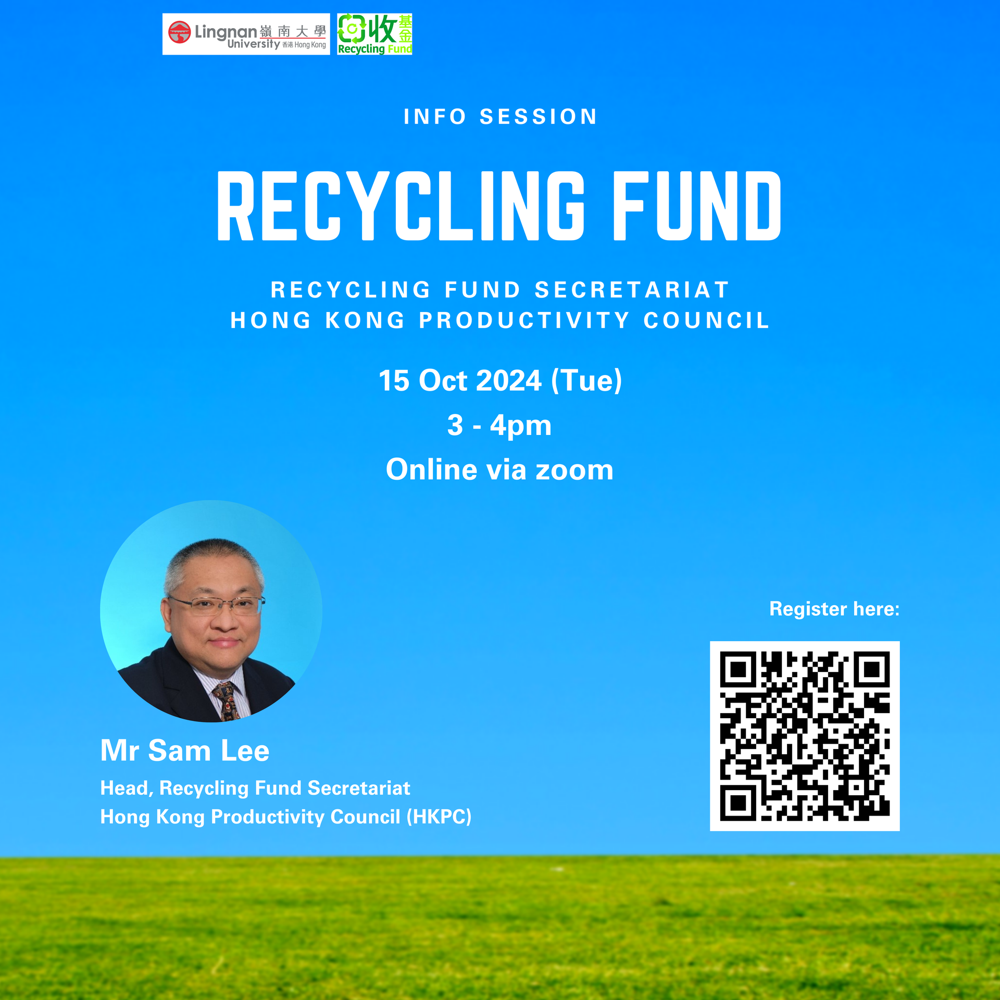



 



 



Hong Kong Productivity Council (HKPC)

Head, Recycling Fund Secretariat



Mr Sam Lee



 



Register here:



Online via zoom

3 - 4pm



15 Oct 2024 (Tue)

HONG KONG PRODUCTIVITY COUNCIL

RECYCLING FUND SECRETARIAT



RECYCLING FUND



INFO SESSION



In [81]:
image = cv2.imread(kfc)
read_text_from_image(image)

# OCR results
cv2_imshow(image)
f = open("results.txt", "r")
lines = f.readlines()
lines.reverse()
for line in lines:
    print(line)
f.close()